*Задание на лабораторную работу №2*

Нужно построить траекторию движения камеры по нескольким изображениям одного объекта (со смещением), выполнив следующие пункты:
- Определите на каждой фотографии ключевые точки.
- Отфильтровать лучшие изображения, обработать изображения.
- Постройте по каждой точке дескриптор (можете использовать любой, рекомендуется SIFT)
- Сопоставьте два соседних изображения на предмет соответствия ключевых точек.
- Постройте модель преобразования изображений, учитывайте только поворот и сдвиг.
- С учетом полученных моделей постройте траекторию движения камеры.

Разрешается использовать методы из *cv2*. Справочная информация в *OpenCV.docs*.

# <font color='#F5DEB3'>1. Подключение библиотек, загрузка данных

In [265]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

from google.colab import drive
from google.colab.patches import cv2_imshow

In [266]:
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# <font color='#F5DEB3'>2. Функции


### <font color='pink'>2.1 Чтение изображения

In [267]:
def read_image(path, scale) -> np.ndarray:
    """
    Чтение изображения с учетом использование Google Colab.

    Вход:
        path - ссылка/путь файла;
        scale - цвет изображения (0 - градация серого, 1 - цветное).
    Выход:
        (np.ndarray) - изображение.
    """
    image = cv2.imread(path, scale)
    # если нет изображения, то ошибка
    if image is None:
        raise ValueError("Изображение не найдено")
    # вывод изображения
    print("Размер и количество цветов:", image.shape)
    cv2_imshow(image) # в цветном изображении в OpenCV используем BGR

    return image

### <font color='pink'>2.2 Перевод в оттенки серого

Для перевода изображения в оттенки серого используют формулу с заданными коэффициентами (https://engee.com/helpcenter/stable/ru/julia/juliaimages/examples/color_channels/rgb_grayscale.html):
> Gray = 0.2989 x *Red* + 0.5870 x *Green* + 0.1140 x *Blue*

Коэффициенты формулы учитывают чувствительность к каждым цветам. У разных людей может отличаться.


In [268]:
def bgr_to_grayscale(image_color) -> np.ndarray:
    """
    Преобразование изображения BGR формата в GrayScale (оттенки серого).

    Вход:
        image_color (np.ndarray) - входное цветное изображение (в формате BRG).
    Выход:
        (np.ndarray) - изображение в градации серого.
    """

    # Применяем формулу для преобразования BGR в grayscale
    blue_component = 0.1140 * image_color[:, :, 0]
    green_component = 0.5870 * image_color[:, :, 1]
    red_component = 0.2989 * image_color[:, :, 2]

    # Получение итогового изображения
    gray_image = blue_component + green_component + red_component

    return gray_image

### <font color='pink'>2.3 Расширение изображения для обработки

**Паддинг** — это процесс добавления дополнительных пикселей вокруг исходного изображения перед применением операций свертки или фильтрации.

Типы паддинга (*mode*):
- constant - заполнение константным значением (например, 0 или 255).
- **reflect - отражение пикселей относительно границы изображения (используется по умолчанию).**
- edge - репликация значений пикселей на краю изображения.
- wrap - циклическое повторение изображения (последние строки становятся первыми и т.д.).
- symmetric - симметричное отражение относительно границы.

In [269]:
def pad_image(image, kernel, mode_pad ='reflect') -> np.ndarray:
    """
    Расширение изображения для применения нескольких методов фильтрации.

    Вход:
        image (np.ndarray) - входное изображение;
        kernel - ядро;
        mode_pad - тип паддинга (заполнение новых границ).
    Выход:
        (np.ndarray) - выходное расширенное изображение.
    """
    if kernel is None:
        raise ValueError("Ядро не найдено")

    kernel_size = kernel.shape[0]
    # вычисление параметра для применения паддинга
    pad = kernel_size // 2
    pad_channel = np.pad(
        array = image,
        pad_width = ((pad, pad), (pad, pad)),
        mode = mode_pad
    )

    return pad_image

### <font color='pink'>2.4 Фильтр Гаусса

**Фильтр Гаусса** — это линейный фильтр, используемый для размытия изображений и уменьшения шума. Он основан на математической функции Гаусса (или нормального распределения), которая определяет веса, применяемые к пикселям в окрестности каждого элемента изображения.

![image.png](https://wikimedia.org/api/rest_v1/media/math/render/svg/6717136818f2166eba2db0cfc915d732add9c64f)

In [270]:
def gaussian_filter(image, kernel) -> np.ndarray:
    """
    Применение фильтра Гаусса к изображению.

    Вход:
        image (np.ndarray) - входное изображение;
        padded_image (np.ndarray) - входное расширенное изображение;
        kernel - ядро;
        sigma - cтандартное отклонение Гаусса.
    Выход:
        np.ndarray: цветное изображение, обработанное фильтром Гаусса.
    """
    kernel_height, kernel_width = kernel.shape
    padding_y = kernel_height // 2
    padding_x = kernel_width // 2

    padded_image = np.pad(
        array = image,
        pad_width = ((padding_y, padding_y), (padding_x, padding_x)),
        mode = 'constant'
    )

    # Обрабатываем каждый канал отдельно
    gaussian_image = np.zeros_like(image)

    for i in range(image.shape[0]):
        for j in range(image.shape[1]):
            region = padded_image[i:i + kernel_height, j:j + kernel_width]
            gaussian_image[i, j] = np.sum(region * kernel)

    return gaussian_image

### <font color='pink'>2.5 Выравнивание яркости

Для выравнивания яркости изображения выберем эталонное изображение (больше всего подходит 2-ая фотография), рассчитаем его среднее значение яркости и стандартное отклонение. Такие же расчеты сделаем для выбранного изображения. После чего используем метод **линейной трансформации яркости**.

Его суть в том, чтобы среднее значение и стандартное отклонение выбранного изображения стали равны эталонному.

In [271]:
def brightness_align(image, reference):
    """
    Выравнивает яркость исходного изображения относительно эталонного
    на основе среднего значения и стандартного отклонения.

    Вход:
        image (np.ndarray) - исходное изображение (оттенки серого).
        reference (np.ndarray) - эталонное изображение (оттенки серого).
    Выход:
        image_ret (np.ndarray) - изображение с выровненной яркостью.
    """

    # Вычисляем среднее значение и стандартное отклонение для обоих изображений
    mean_image, std_image = np.mean(image), np.std(image)
    mean_reference, std_reference = np.mean(reference), np.std(reference)

    # Применяем линейное преобразование для выравнивания яркости
    image_ret = (std_reference / std_image) * (image - mean_image) + mean_reference

    # Обрезаем значения до допустимого диапазона [0, 255]
    image_ret = np.clip(image_ret, 0, 255).astype(np.uint8)

    return image_ret

### <font color='pink'>2.6 Детектор Харриса

Харрис и Стефенс улучшили детектор Моравеца (Moravec), введя анизотропию по всем направлениям, т.е. рассматривают производные яркости изображения для исследования изменений яркости по множеству направлений. Они вводят в рассмотрение производные по некоторым принципиальным направлениям.

**Детектор Моравеца** – самый простой из существующих. Автор рассматривает изменение яркости квадратного окна W (обычно размера 3х3, 5х5, 7х7 пикселей) относительно интересующей точки при сдвиге окна W на 1 пиксель в 8-ми направлениях (горизонтальных, вертикальных и диагональных).

Взвешенная сумма квадрата разностей:
![image.png](https://habrastorage.org/r/w1560/files/68b/9ce/118/68b9ce1189b34b698309a7d70414a913.png)

где w(x,y) – весовая функция (обычно используется функция Гаусса или бинарное окно).

![image.png](https://habrastorage.org/r/w1560/files/b06/ae8/34c/b06ae834c0c34fa588961baa95fa8610.png)

M – автокорреляционная матрица:

![image.png](https://habrastorage.org/files/a29/58a/acb/a2958aacbe3b49feae98047cf8f9cd69.png)

Угол характеризуется большими изменениями функции E(x,y) по всем возможным направлениям (x,y), что эквивалентно большим по модулю собственным значениям матрицы M. Расположение собственных значений приведено на следующем рисунке.
![image.png](https://habrastorage.org/r/w1560/files/487/859/f3d/487859f3d0e6455cb2b62baad30220c1.png)

Поскольку напрямую считать собственные значения является трудоёмкой задачей, Харрисом и Стефеном была предложена мера отклика:
![image.png](https://habrastorage.org/r/w1560/files/fe8/119/9a8/fe81199a88d1413b98123860db3d37a9.png)

где k – эмпирическая константа, ![image.png](https://habrastorage.org/r/w1560/files/0bb/4e2/9df/0bb4e29dfed948d6bab28aee61fc366a.png)

***det(M)*** - модуль матрицы М; ***tr(M)*** - сумма собственных чисел матрицы М.

Таким образом, значение R положительно для угловых особых точек. Затем производится отсечение точек по найденному порогу R (т.е. те точки, у которых значение R меньше некоторого порога, исключаются из рассмотрения).

Ссылка на статью: https://habr.com/ru/articles/244541/

In [272]:
def harris_corner_detector(image, k = 0.04, threshold = 0.005) -> list:
    """
    Детектор углов Харриса.

    Вход:
        image (np.ndarray) - изображение в оттенках серого.
        k - параметр уравнения Харриса (обычно 0.04-0.06).
        threshold -  порог для выбора углов (от 0 до 1).
    Выход:

    :return: Изображение с отмеченными углами.
    """
    # Вычисление производных по x и y (градиенты)
    Ix = np.gradient(image, axis=1)
    Iy = np.gradient(image, axis=0)

    # Вычисление элементов матрицы М (структурного тензора)
    Ix2 = Ix ** 2
    Iy2 = Ix ** 2
    Ixy = Ix * Iy

    # Размытие для учета локальной окрестности
    kernel_size = 3
    sigma = 2

    ax = np.linspace(-(kernel_size // 2), kernel_size // 2, kernel_size)
    xx, yy = np.meshgrid(ax, ax)
    kernel = np.exp(-(xx**2 + yy**2) / (2 * sigma**2))
    kernel /= np.sum(kernel)

    Ix2_blur = gaussian_filter(Ix2, kernel)
    Iy2_blur = gaussian_filter(Iy2, kernel)
    Ixy_blur = gaussian_filter(Ixy, kernel)

    # Вычисление углового отклика R для каждого пикселя
    det_M = Ix2_blur * Iy2_blur - Ixy_blur ** 2
    trace_M = Ix2_blur + Iy2_blur
    R = det_M - k * (trace_M ** 2)

    # Применение порога для выбора углов
    R_max = np.max(R)
    corners = R > threshold * R_max

    # Преобразование найденных углов в формат cv2.KeyPoint
    keypoints = []
    for y, x in np.argwhere(corners):  # Получаем координаты всех углов
        keypoints.append(cv2.KeyPoint(x=float(x), y=float(y), size=1, angle=0))  # Создаем KeyPoint

    return keypoints

### <font color='pink'>2.7 Дескриптор SIFT

**Дескриптор** – идентификатор особой точки, выделяющий её из остального множества особых точек. В свою очередь, дескрипторы должны обеспечивать инвариантность нахождения соответствия между особыми точками относительно преобразований изображений.

Источник: https://habr.com/ru/articles/106302/

В методе SIFT дескриптором является вектор. Как и направление ключевой точки, дескриптор вычисляется на гауссиане, ближайшем по масштабу к ключевой точке, и исходя из градиентов в некотором окне ключевой точки. Перед вычислением дескриптора это окно поворачивают на угол направления ключевой точки, чем и достигается инвариантность относительно поворота.

![image.png](https://habrastorage.org/r/w780/storage/habraeffect/fe/6b/fe6b57079b5e7a2f195173ad982ecccc.png)

SIFT дескрипторы не лишены недостатков. Не все полученные точки и их дескрипторы будут отвечать предъявляемым требованиям. Естественно это будет сказываться на дальнейшем решении задачи сопоставления изображений. В некоторых случаях решение может быть не найдено, даже если оно существует.

In [273]:
def compute_sift_descriptor(image,
                            keypoints,
                            patch_size=16,
                            num_orientation_bins=8):
    """
    Расчет SIFT дескрипторов дляточек интереса на изображении.

    Вход:
        image (np.ndarray) - изображение в оттенках серого.
        keypoints (cv2.KeyPoint) - cписок ключевых точек.
        patch_size - размер области вокруг каждой точки.
        num_orientation_bins - количество бинов для гистограммы ориентации.
    Выход:
    :return: массив дескрипторов.
    """

    descriptors = []
    image = image.astype(np.float32)

    # Вычисление градиентов по x и y
    dx = cv2.Sobel(image, cv2.CV_32F, 1, 0, ksize=3)
    dy = cv2.Sobel(image, cv2.CV_32F, 0, 1, ksize=3)
    magnitude = np.sqrt(dx ** 2 + dy ** 2)
    orientation = np.arctan2(dy, dx) * (180 / np.pi) % 360  # Угол в градусах [0, 360)

    for keypoint in keypoints:
        x, y = keypoint.pt
        x, y = int(x), int(y)
        half_size = patch_size // 2

        if (x - half_size < 0 or x + half_size >= image.shape[1] or
            y - half_size < 0 or y + half_size >= image.shape[0]):
            descriptors.append(np.zeros(128))
            continue

        patch_magnitude = magnitude[y - half_size:y + half_size, x - half_size:x + half_size]
        patch_orientation = orientation[y - half_size:y + half_size, x - half_size:x + half_size]

        cell_size = patch_size // 4
        descriptor = []
        for i in range(4):
            for j in range(4):
                cell_magnitude = patch_magnitude[i * cell_size:(i + 1) * cell_size, j * cell_size:(j + 1) * cell_size]
                cell_orientation = patch_orientation[i * cell_size:(i + 1) * cell_size, j * cell_size:(j + 1) * cell_size]

                hist, _ = np.histogram(cell_orientation, bins=num_orientation_bins, range=(0, 360), weights=cell_magnitude)
                descriptor.extend(hist)

        # Нормализуем дескриптор
        descriptor = np.array(descriptor, dtype=np.float32)
        descriptor /= np.linalg.norm(descriptor) + 1e-8  # Добавляем маленькое значение, чтобы избежать деления на ноль
        descriptor = np.clip(descriptor, 0, 0.2)  # Обрезаем значения до 0.2
        descriptor /= np.linalg.norm(descriptor) + 1e-8  # Повторная нормализация

        descriptors.append(descriptor)

    return np.array(descriptors)

### <font color='pink'>2.8 Нахождение соответствий

1. Вычисление Евклидова расстояния
Используется формула Евклидова расстояния:

     ![image.png](https://ic.pics.livejournal.com/yu_xuan/12681078/223220/223220_original.png)

2. Сортировка расстояний :
Расстояния сортируются по возрастанию, чтобы найти два ближайших соседа (тест Лоу)
Если расстояние до ближайшего соседа (m_distance) значительно меньше, чем расстояние до второго ближайшего соседа (n_distance), то соответствие считается хорошим.

In [274]:
def match_descriptors(descriptors1, descriptors2, ratio_threshold = 0.75):
    """
    Находит соответствия между двумя наборами дескрипторов.

    Вход:
        descriptors1 (np.ndarray) - дескрипторы первого изображения.
        descriptors2 (np.ndarray) - дескрипторы второго изображения.
        ratio_threshold - порог для фильтрации соответствий.
    Выход:
    :return: Список индексов хороших соответствий.
    """
    matches = []

    # Вычисление Евклидова расстояния между всеми парами дескрипторов
    for i, desc1 in enumerate(descriptors1):
        distances = np.linalg.norm(descriptors2 - desc1, axis=1)  # Расстояния до всех дескрипторов второго набора
        sorted_indices = np.argsort(distances)  # Индексы отсортированных расстояний
        m_distance = distances[sorted_indices[0]]  # Расстояние до ближайшего соседа
        n_distance = distances[sorted_indices[1]]  # Расстояние до второго ближайшего соседа

        # Тест Лоу (Low Ratio Test)
        if m_distance < ratio_threshold * n_distance:
            matches.append((i, sorted_indices[0]))  # Сохраняем индексы соответствующих дескрипторов

    return matches

### <font color='pink'>2.9 Оценка трансформаций

1. Для каждой пары соответствий из matches извлекаются координаты ключевых точек из keypoints1 и keypoints2.
2. Точки центрируются относительно их центров масс, чтобы устранить влияние сдвига при вычислении поворота.
3. Матрица ковариации H вычисляется как произведение центрированных точек.
4. Разложение по сингулярным числам используется для нахождения матрицы поворота R, которая минимизирует ошибку между точками.
5. Угол поворота вычисляется из матрицы R. Вектор сдвига вычисляется как разница между центрами масс после применения поворота.
6. Матрица преобразования объединяет поворот (R) и сдвиг (t).

In [275]:
def estimate_transformation(matches, keypoints1, keypoints2):
    """
    Оценивает трансформацию (поворот и сдвиг) между двумя наборами точек.

    Вход:
        matches (np.ndarray) - соотношения между двумя изображениями.
        keypoints1 (cv2.KeyPoint) - ключевые точки первого изображения.
        keypoints2 (cv2.KeyPoint) - ключевые точки второго изображения.
    Выход:
    :return: Матрица 2x3 преобразования (угол поворота и сдвиг).
    """

    if len(matches) < 2:
        raise ValueError("Требуется минимум 2 пары точек для оценки трансформации.")

    # Извлечение координат соответствующих точек
    points1 = np.array([keypoints1[m[0]].pt for m in matches])
    points2 = np.array([keypoints2[m[1]].pt for m in matches])

    # Центрируем точки вокруг их центров масс
    centroid1 = np.mean(points1, axis=0)
    centroid2 = np.mean(points2, axis=0)
    centered_points1 = points1 - centroid1
    centered_points2 = points2 - centroid2

    # Вычисляем матрицу ковариации
    H = np.dot(centered_points1.T, centered_points2)

    # Разложение по сингулярным числам (SVD)
    U, S, Vt = np.linalg.svd(H)

    # Матрица поворота
    R = np.dot(Vt.T, U.T)

    # Угол поворота
    angle = np.arctan2(R[1, 0], R[0, 0])  # Угол в радианах

    # Вектор сдвига
    t = centroid2 - np.dot(R, centroid1)

    # Формируем матрицу 2x3 преобразования
    transformation_matrix = np.zeros((2, 3))
    transformation_matrix[:2, :2] = R
    transformation_matrix[:, 2] = t

    return transformation_matrix

### <font color='pink'>2.10 Пострение траектории

In [276]:
def compute_trajectory(transformations):
    """
    Оценивает трансформацию (поворот и сдвиг) между двумя наборами точек.

    Вход:
        transformations - массив из матриц преобразований.

    Выход:
    :return: Траектория движения камеры.
    """
    trajectory = [np.array([0, 0])]
    current_position = np.array([0., 0.])  # Начальная позиция камеры

    for transformation in transformations:

        # Извлечение сдвига из матрицы преобразования
        translation = transformation[:, 2]

        # Обновление позиции камеры
        current_position += translation

        trajectory.append(-current_position.copy())

    return np.array(trajectory)

### <font color='pink'>2.11 Отрисовка движения камеры

In [277]:
import matplotlib.pyplot as plt

def draw(image1, keypoints1, image2, keypoints2, matches):
    """
    Отрисовывает линии между соответствующими ключевыми точками двух изображений.

    Вход:
        image1 (np.ndarray) - первое изображение в градациях серого.
        keypoints1 (list) - ключевые точки первого изображения (список cv2.KeyPoint).
        image2 (np.ndarray) - второе изображение в градациях серого.
        keypoints2 (list) - ключевые точки второго изображения (список cv2.KeyPoint).
        matches (list) - Список соответствий.
    """
    # Объединяем изображения горизонтально
    h1, w1 = image1.shape
    h2, w2 = image2.shape
    combined_image = np.zeros((max(h1, h2), w1 + w2), dtype=np.uint8)
    combined_image[:h1, :w1] = image1
    combined_image[:h2, w1:] = image2

    # Создаем фигуру для отображения
    fig, ax = plt.subplots(1, 1, figsize=(15, 10))
    ax.imshow(combined_image, cmap='gray')

    # Рисуем линии между соответствующими точками
    for idx1, idx2 in matches:
        pt1 = keypoints1[idx1].pt  # Координаты точки на первом изображении
        pt2 = keypoints2[idx2].pt  # Координаты точки на втором изображении
        x1, y1 = pt1
        x2, y2 = pt2[0] + w1, pt2[1]  # Сдвигаем координаты второй точки
        ax.plot([x1, x2], [y1, y2], color='red', linewidth=1)

    # Настройка графика
    ax.axis('off')
    plt.title("Соответствия между ключевыми точками")
    plt.show()

# <font color='#F5DEB3'>3. Основная часть работы

## <font color='white'>3.1 Чтение и запись изображений

In [278]:
paths1 = ('/content/drive/MyDrive/Colab Notebooks/CV_LB2_data/2.jpg',
         '/content/drive/MyDrive/Colab Notebooks/CV_LB2_data/1.jpg',
         '/content/drive/MyDrive/Colab Notebooks/CV_LB2_data/3.jpg',
         '/content/drive/MyDrive/Colab Notebooks/CV_LB2_data/4.jpg',
         '/content/drive/MyDrive/Colab Notebooks/CV_LB2_data/5.jpg'
)

paths2 = ('/content/drive/MyDrive/Colab Notebooks/CV_LB2_data/6.jpg',
         '/content/drive/MyDrive/Colab Notebooks/CV_LB2_data/7.jpg',
         '/content/drive/MyDrive/Colab Notebooks/CV_LB2_data/8.jpg',
         '/content/drive/MyDrive/Colab Notebooks/CV_LB2_data/9.jpg',
)

Размер и количество цветов: (960, 1280, 3)


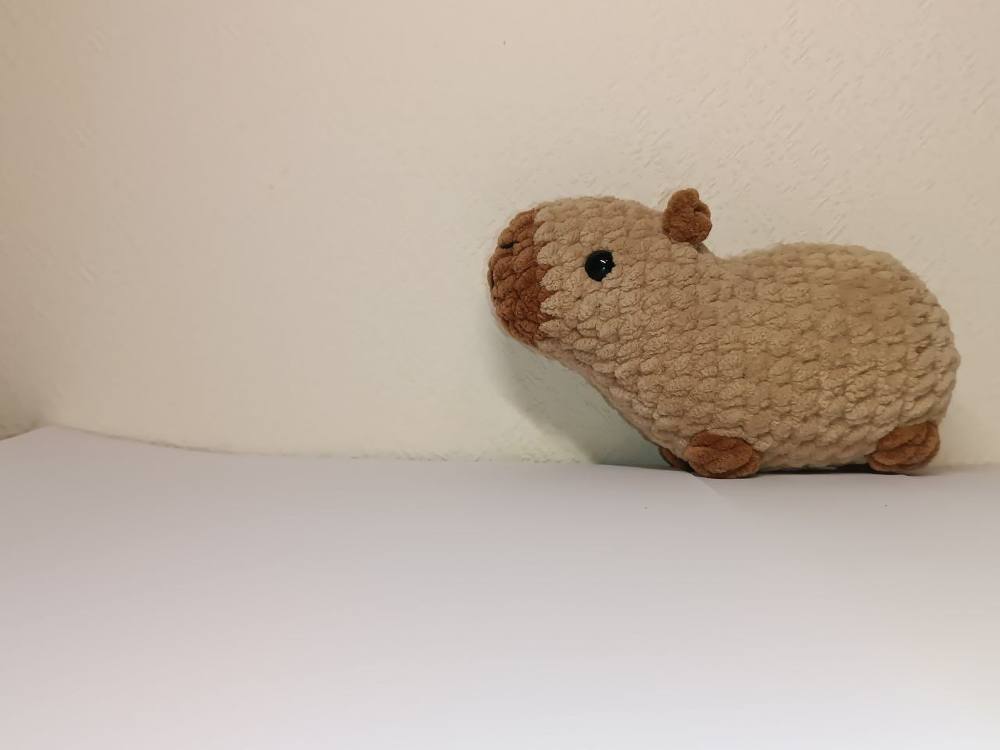

Размер и количество цветов: (960, 1280, 3)


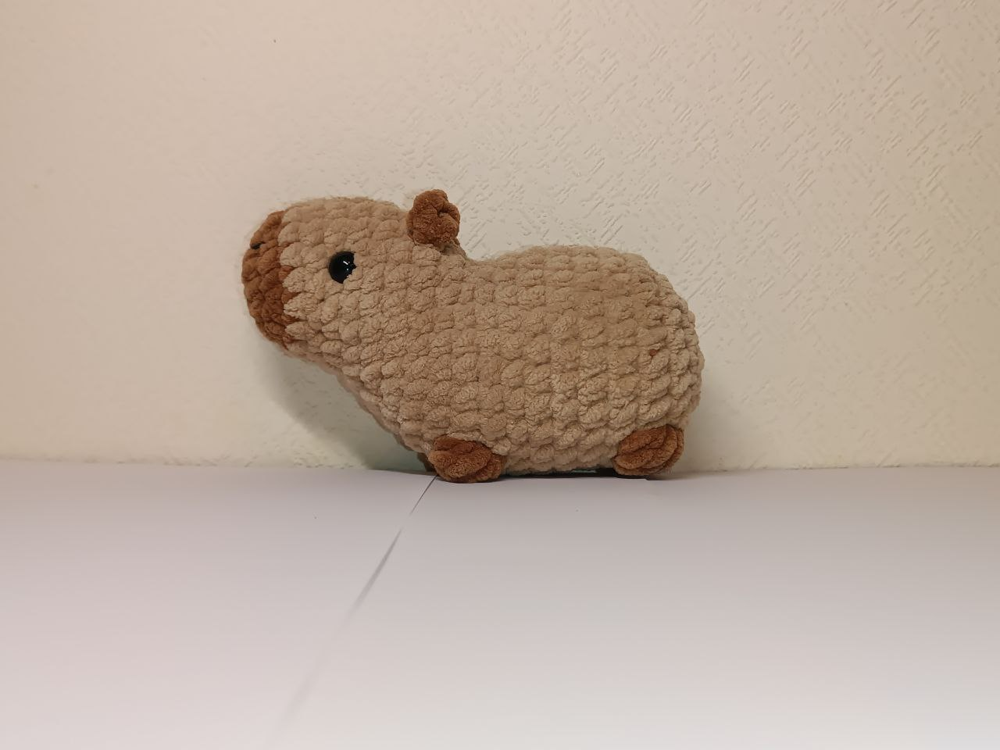

Размер и количество цветов: (960, 1280, 3)


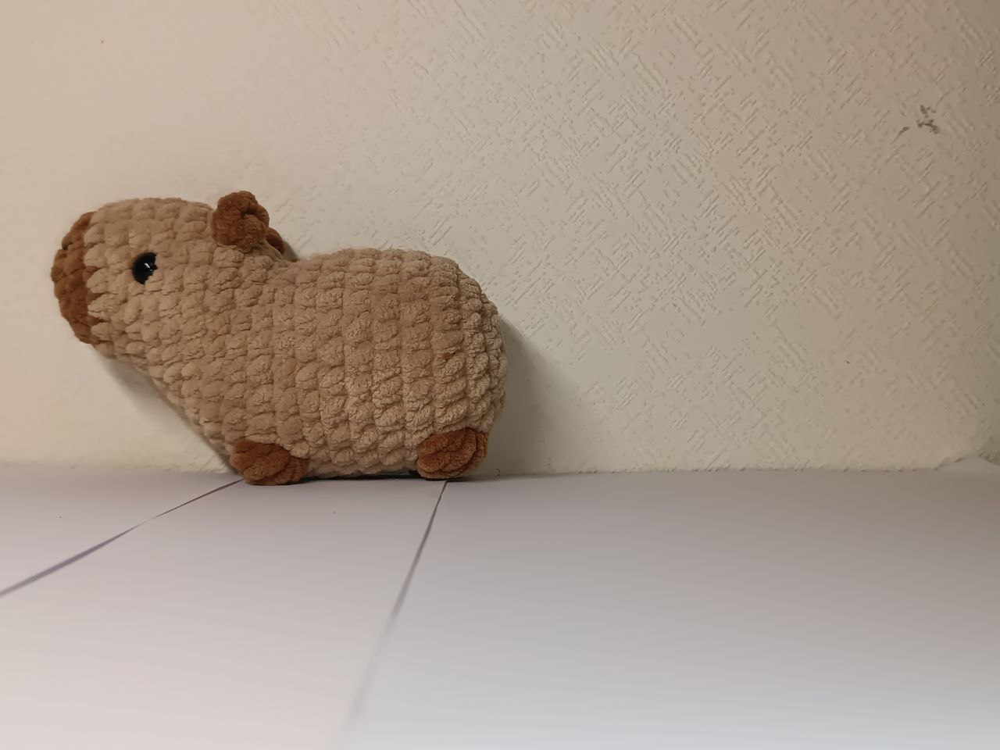

Размер и количество цветов: (960, 1280, 3)


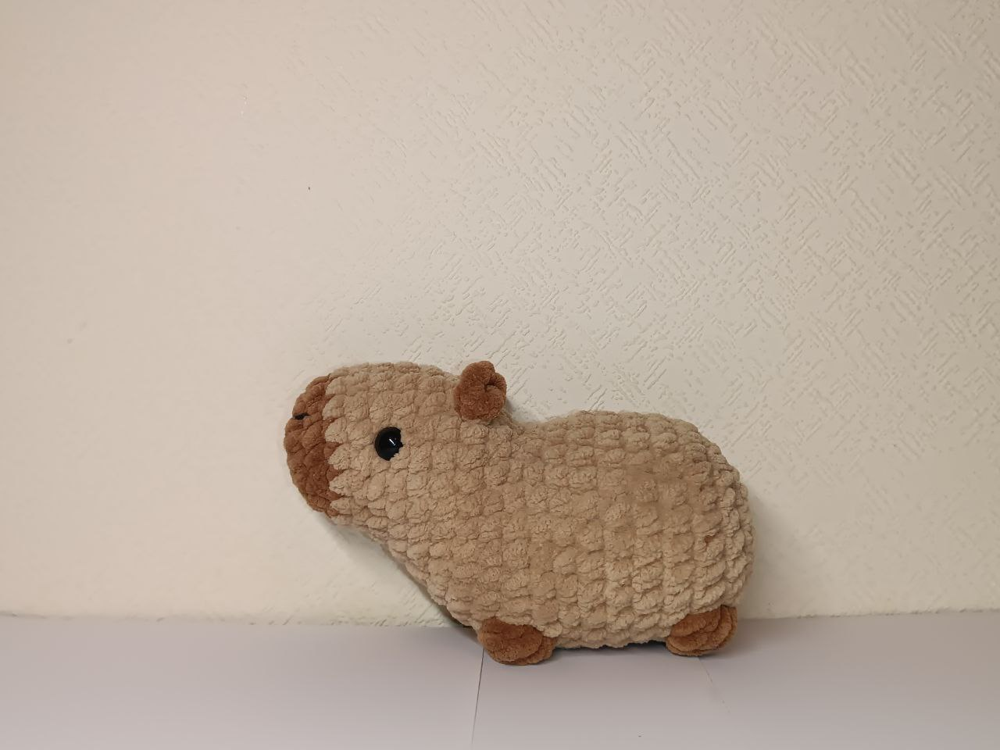

In [279]:
img_originals = []
for path in paths2:
    img_originals.append(read_image(path, 1).copy())

array([[[160, 176, 193],
        [160, 176, 193],
        [161, 177, 194],
        ...,
        [175, 191, 207],
        [175, 191, 207],
        [175, 191, 207]],

       [[160, 176, 193],
        [160, 176, 193],
        [161, 177, 194],
        ...,
        [175, 191, 207],
        [175, 191, 207],
        [175, 191, 207]],

       [[160, 176, 193],
        [160, 176, 193],
        [161, 177, 194],
        ...,
        [175, 191, 207],
        [175, 191, 207],
        [175, 191, 207]],

       ...,

       [[193, 195, 205],
        [193, 195, 205],
        [193, 195, 205],
        ...,
        [203, 206, 214],
        [203, 206, 214],
        [201, 206, 213]],

       [[194, 196, 206],
        [194, 196, 206],
        [194, 196, 206],
        ...,
        [203, 206, 214],
        [203, 206, 214],
        [201, 207, 214]],

       [[194, 196, 206],
        [194, 196, 206],
        [194, 196, 206],
        ...,
        [203, 206, 214],
        [203, 206, 214],
        [201, 207, 214]]], dtype=uint8)
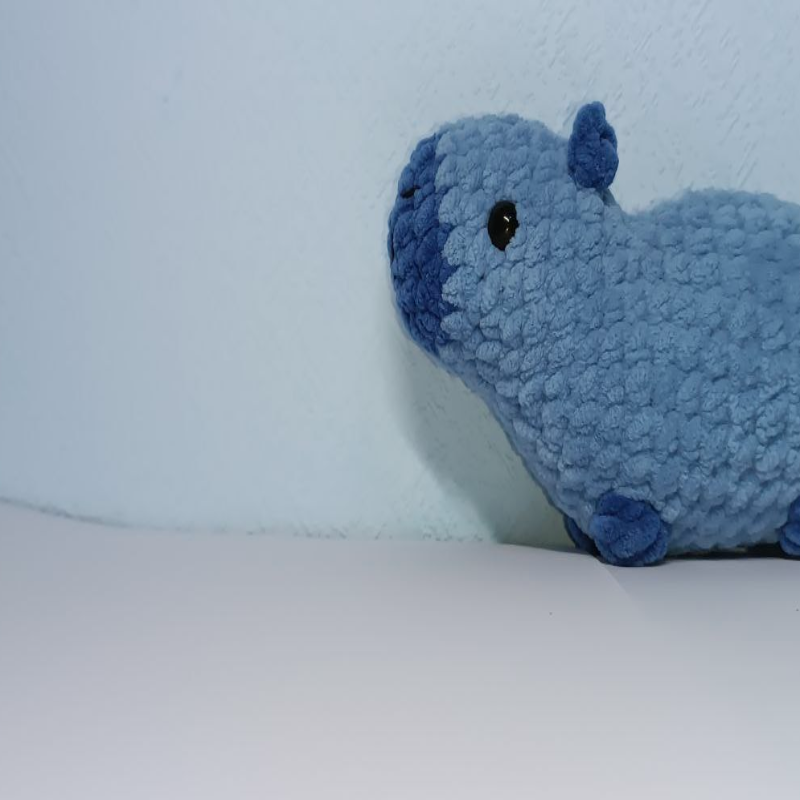

array([[[171, 186, 205],
        [171, 186, 205],
        [171, 186, 205],
        ...,
        [156, 176, 193],
        [156, 176, 193],
        [158, 178, 195]],

       [[171, 186, 205],
        [171, 186, 205],
        [171, 186, 205],
        ...,
        [156, 176, 193],
        [156, 176, 193],
        [157, 177, 194]],

       [[171, 186, 205],
        [171, 186, 205],
        [171, 186, 205],
        ...,
        [156, 176, 193],
        [156, 176, 193],
        [156, 176, 193]],

       ...,

       [[197, 198, 212],
        [197, 198, 212],
        [197, 198, 212],
        ...,
        [192, 195, 203],
        [192, 195, 203],
        [192, 195, 203]],

       [[197, 198, 212],
        [197, 198, 212],
        [197, 198, 212],
        ...,
        [192, 195, 203],
        [192, 195, 203],
        [192, 195, 203]],

       [[197, 198, 212],
        [197, 198, 212],
        [197, 198, 212],
        ...,
        [192, 195, 203],
        [192, 195, 203],
        [192, 195, 203]]], dtype=uint8)
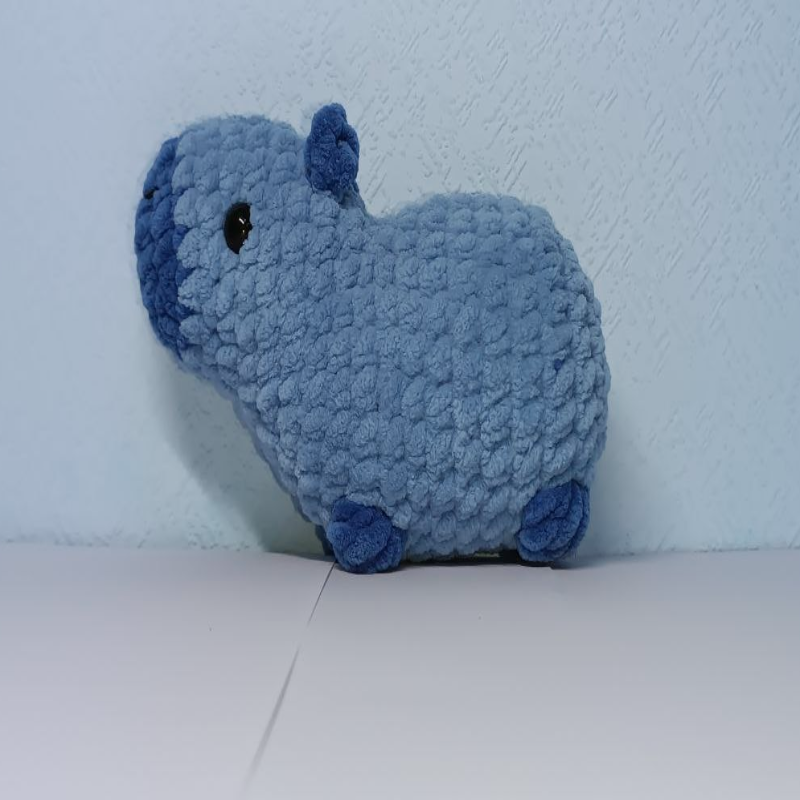

array([[[168, 184, 201],
        [168, 184, 201],
        [168, 184, 201],
        ...,
        [127, 145, 162],
        [128, 145, 163],
        [123, 143, 160]],

       [[168, 184, 201],
        [168, 184, 201],
        [168, 184, 201],
        ...,
        [127, 145, 162],
        [127, 145, 162],
        [124, 144, 161]],

       [[168, 184, 201],
        [168, 184, 201],
        [168, 184, 201],
        ...,
        [127, 145, 162],
        [127, 145, 162],
        [125, 145, 162]],

       ...,

       [[192, 194, 204],
        [192, 194, 204],
        [192, 194, 204],
        ...,
        [162, 165, 173],
        [162, 165, 173],
        [162, 165, 173]],

       [[193, 195, 205],
        [193, 195, 205],
        [193, 195, 205],
        ...,
        [163, 166, 174],
        [163, 166, 174],
        [162, 165, 173]],

       [[193, 195, 205],
        [193, 195, 205],
        [193, 195, 205],
        ...,
        [163, 166, 174],
        [163, 166, 174],
        [162, 165, 173]]], dtype=uint8)
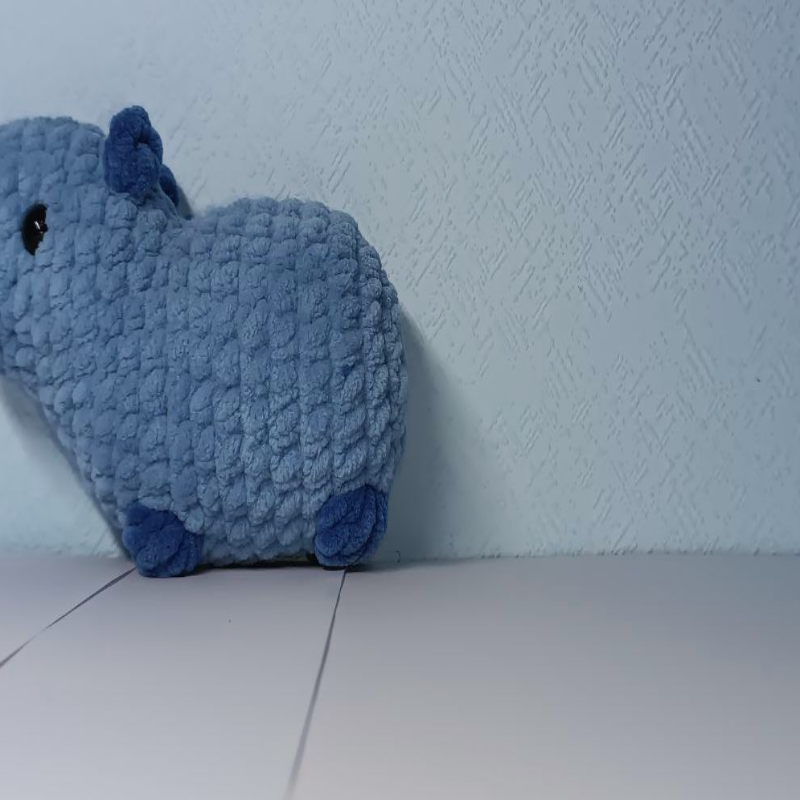

array([[[180, 193, 209],
        [180, 193, 208],
        [179, 192, 208],
        ...,
        [162, 178, 190],
        [163, 178, 190],
        [162, 178, 190]],

       [[180, 193, 209],
        [179, 193, 208],
        [179, 192, 208],
        ...,
        [162, 178, 190],
        [162, 178, 190],
        [162, 178, 190]],

       [[180, 193, 209],
        [180, 193, 208],
        [179, 192, 208],
        ...,
        [161, 178, 190],
        [160, 176, 188],
        [161, 177, 189]],

       ...,

       [[171, 180, 194],
        [170, 179, 193],
        [169, 178, 192],
        ...,
        [149, 158, 171],
        [149, 158, 171],
        [149, 158, 171]],

       [[171, 180, 194],
        [171, 180, 194],
        [170, 179, 193],
        ...,
        [149, 158, 171],
        [149, 158, 171],
        [149, 158, 171]],

       [[171, 180, 194],
        [171, 180, 194],
        [171, 180, 194],
        ...,
        [149, 158, 171],
        [149, 158, 171],
        [149, 158, 171]]], dtype=uint8)
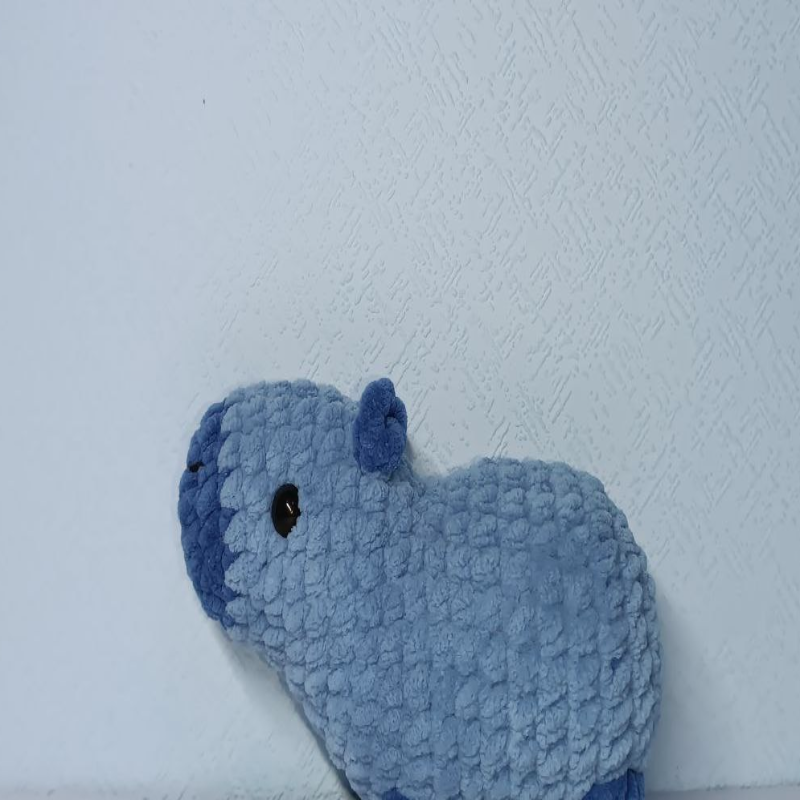

In [280]:
images = []
for image in img_originals:
    image = image[image.shape[0] // 6:-1 - image.shape[0] // 6, image.shape[1] // 9:-1 - image.shape[1] // 9]
    image = cv2.resize(image, (800, 800))
    images.append(image.copy())
    display(image)
del img_originals

In [281]:
images_gray = []
for path in images:
  images_gray.append(bgr_to_grayscale(path).copy())

## <font color='white'>3.2 Выравнивание яркости изображений

Выравнивание яркости необходимо для того, чтобы в дальнейшем использовать дескриптор ключевых точек (идентификатор ключевой точки, выделяющий её из остальной массы особых точек). Для этого используем метод **линейной трансформации яркости** (описан в пункте 2.3). Его суть в том, чтобы среднее значение и стандартное отклонение выбранного изображения стали равны эталонному.

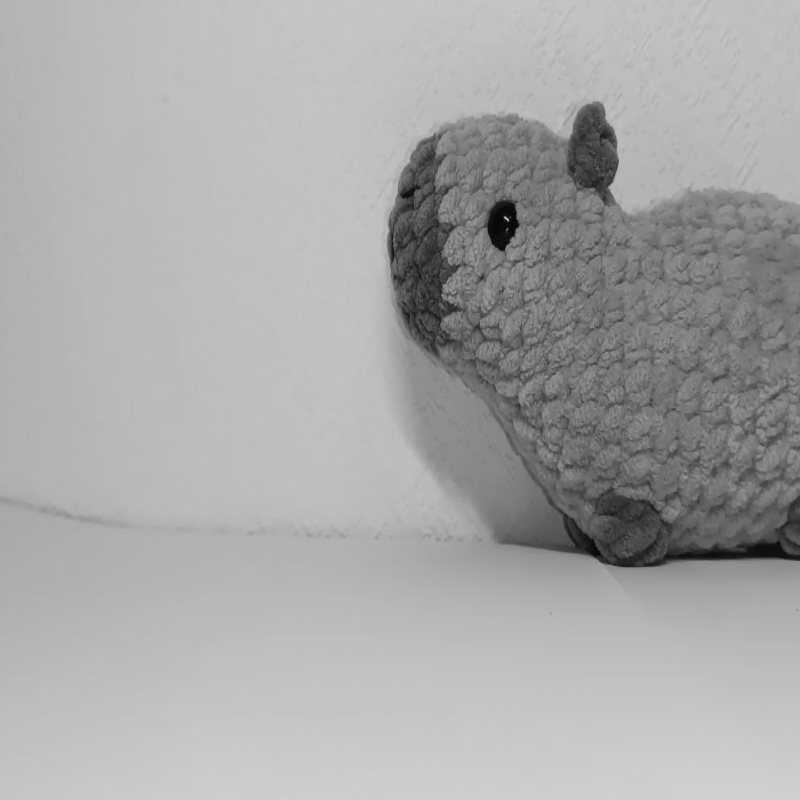

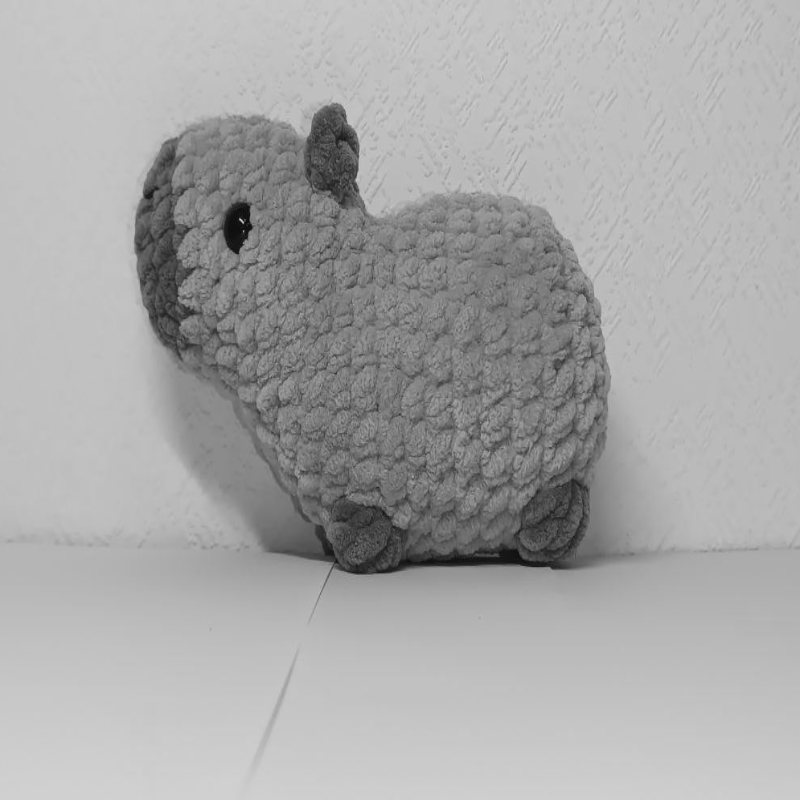

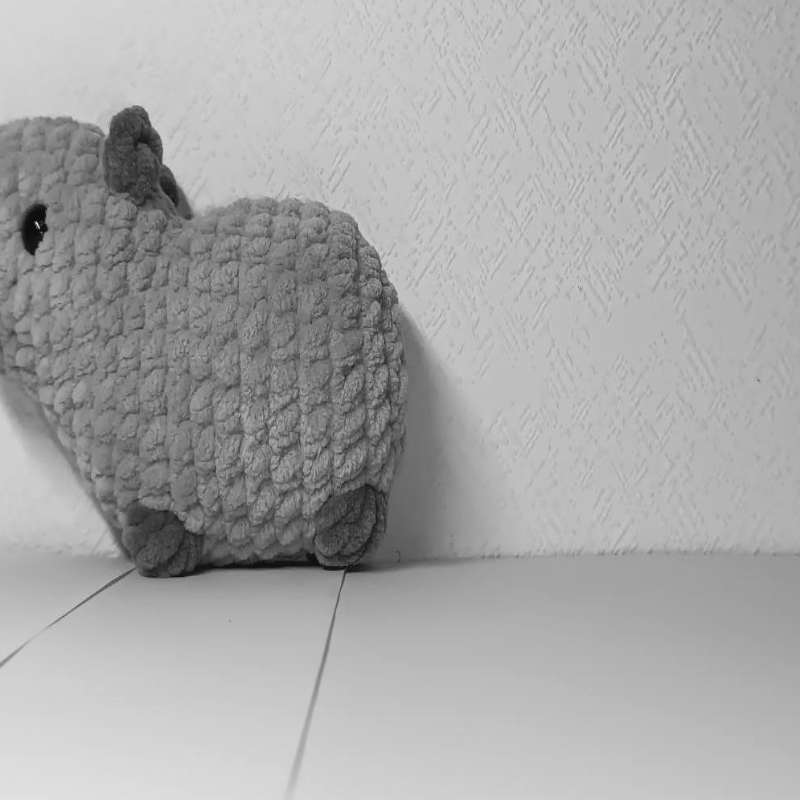

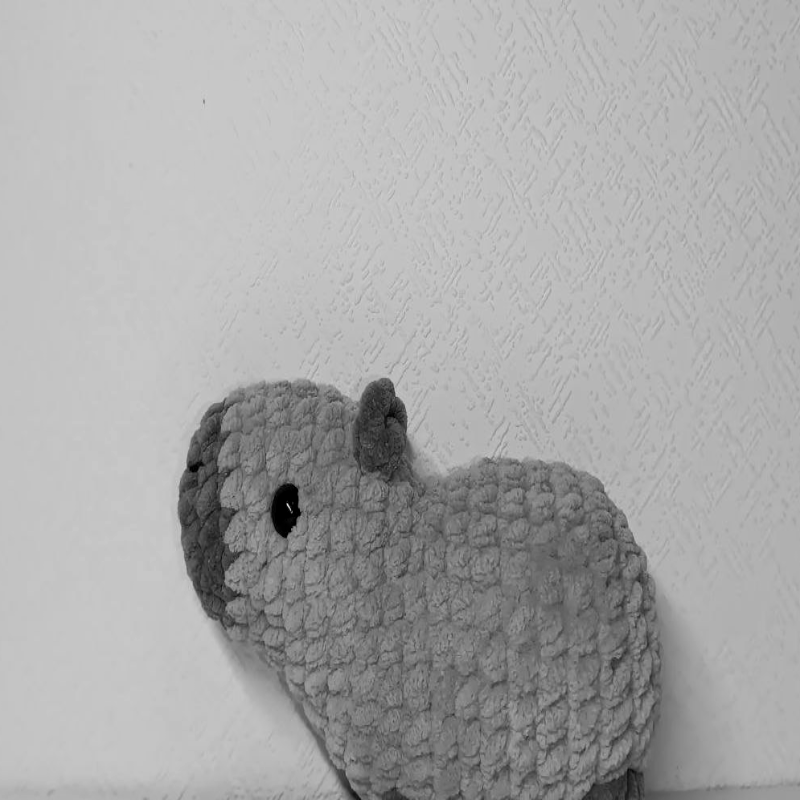

In [282]:
image_reference = images_gray[0]

images_align = []
for image in images_gray:
  image_align = brightness_align(image, image_reference)
  images_align.append(image_align)
  cv2_imshow(image_align)

## <font color='white'>3.3 Поиск и идентификация ключевых точек

**Детектор** – это метод извлечения особых точек из изображения. Детектор обеспечивает инвариантность нахождения одних и тех же особых точек относительно преобразований изображений.

**Дескриптор** – идентификатор особой точки, выделяющий её из остального множества особых точек. В свою очередь, дескрипторы должны обеспечивать инвариантность нахождения соответствия между особыми точками относительно преобразований изображений.

Если следовать из определений, то с помощью детектора мы находим особые точки, а с помощью дескриптора мы описываем окресности особых точек (векторы).

Требования к особым точкам в виде следующих свойств: отличимость, инвариантность, стабильность, уникальность, интерпретируемость.

В качестве детектора будем использовать **детектор Харриса** (или оператор Плессея). Детектор Харриса инвариантен к поворотам. К недостаткам стоит отнести чувствительность к шуму и зависимость детектора от масштаба изображения (у нас все изображения одинакового размера).

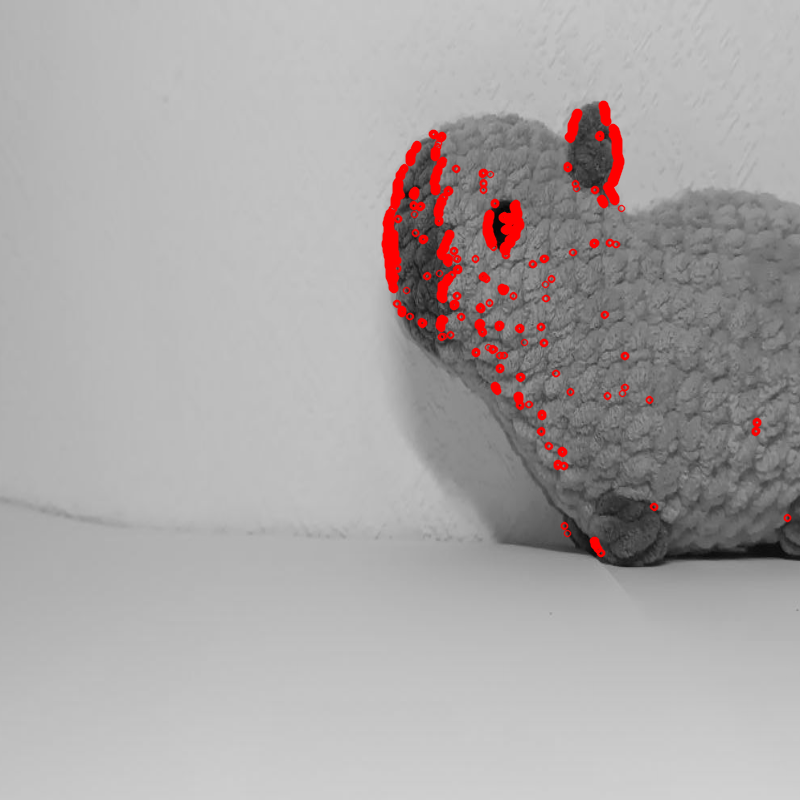

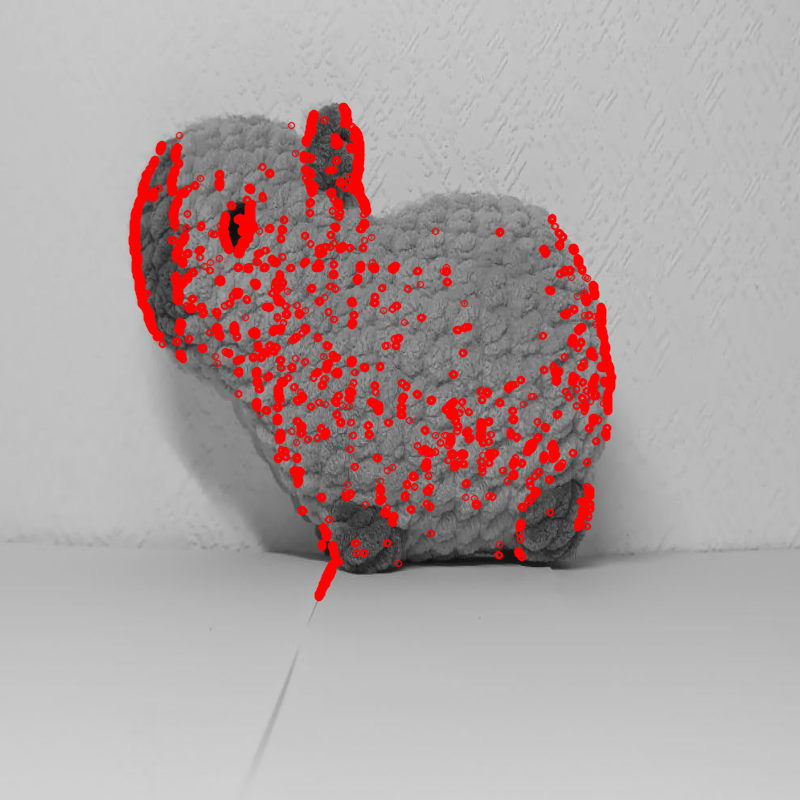

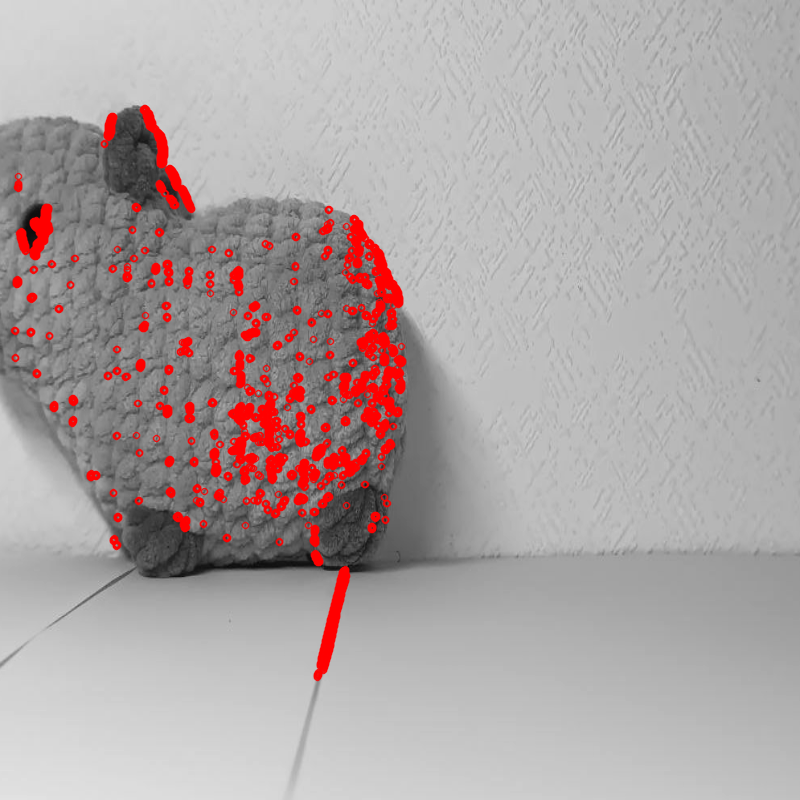

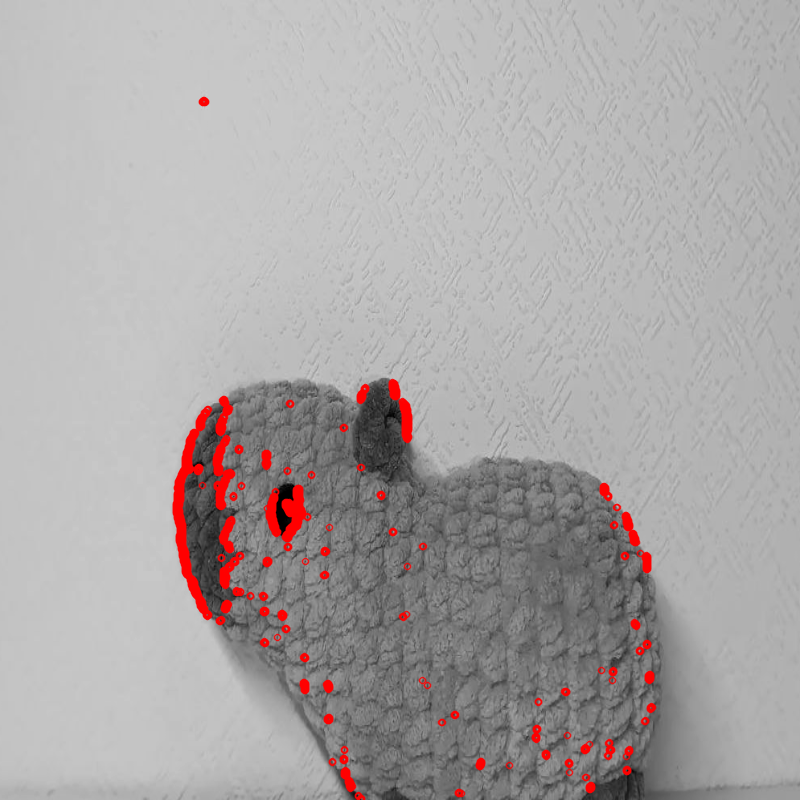

In [283]:
keypoints = []
for image in images_align:
    harris_points = harris_corner_detector(image)
    keypoints.append(harris_points)
    output_image = cv2.drawKeypoints(image, harris_points, None, color=(0, 0, 255))  # Рисуем углы
    cv2_imshow(output_image)

В итоге получается следующая схема решения задачи сопоставления изображений:
1. На изображениях выделяются ключевые точки и их дескрипторы.
2. По совпадению дескрипторов выделяются соответствующие друг другу ключевые точки.
3. На основе набора совпавших ключевых точек строится модель преобразования изображений, с помощью которого из одного изображения можно получить другое.

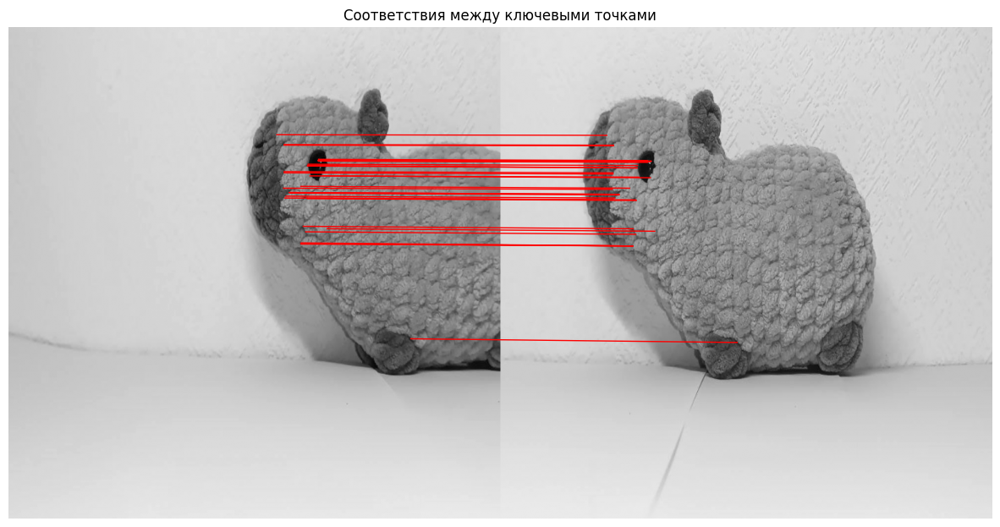

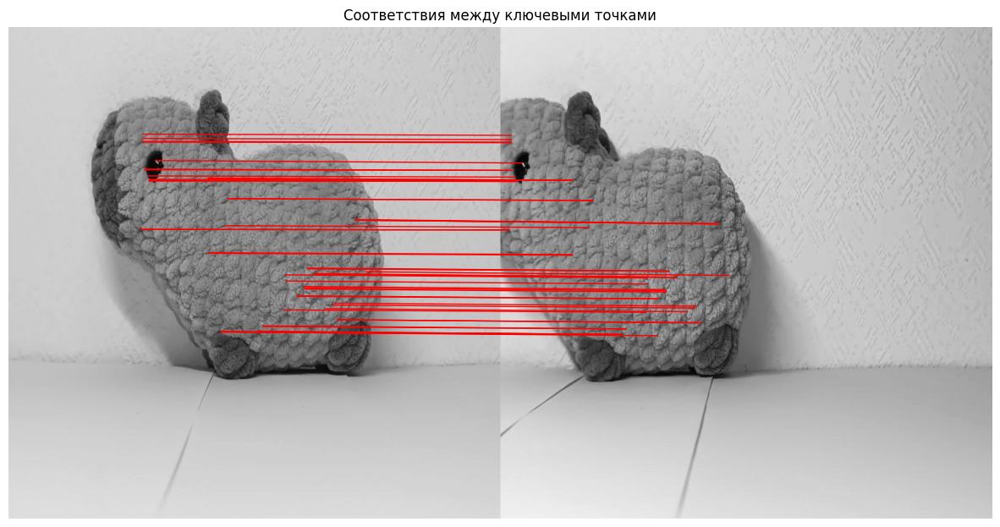

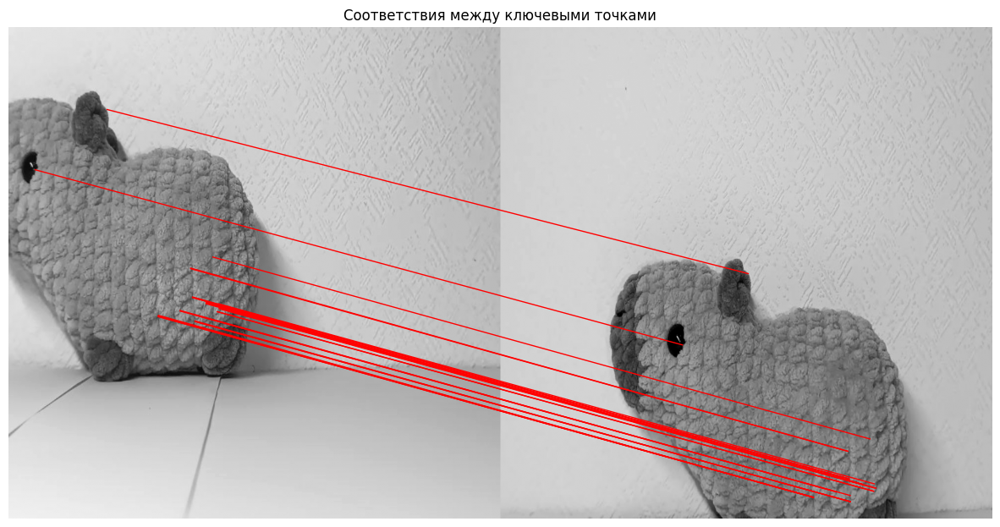

In [284]:
# Инициализация данных
image_i = images_gray[0]
transformations = []

for image in images_gray[1:]:

    # Выравнивание яркости
    image = brightness_align(image, image_i)

    # Обнаружение ключевых точек
    keypoints = harris_corner_detector(image)
    keypoints_i = harris_corner_detector(image_i)

    # Дескрипторы
    descriptors = compute_sift_descriptor(image, keypoints)
    descriptors_i = compute_sift_descriptor(image_i, keypoints_i)

    # Сопоставление ключевых точек
    matches = match_descriptors(descriptors_i, descriptors)

    # Визуализация текущей пары
    match_image = draw(
        image_i, keypoints_i,
        image, keypoints,
        matches)

    transformation = estimate_transformation(matches, keypoints_i, keypoints)
    transformations.append(transformation)

    image_i = image

## <font color='white'>3.4 Траектория движения камеры

Траектория движения камеры: [[   0.            0.        ]
 [ 263.95045593   -1.84666493]
 [ 465.12377244    1.45548077]
 [ 205.50044407 -295.83515983]]


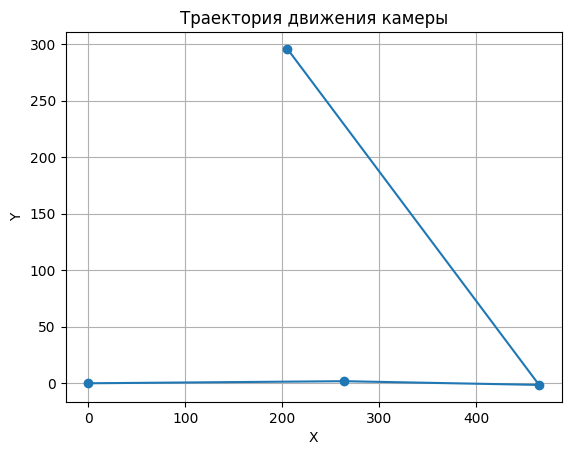

In [285]:
# Построение траектории
trajectory = compute_trajectory(transformations)

# Принт траектории
print("Траектория движения камеры:", trajectory)

# Построение траектории на графике
trajectory = np.array(trajectory)
plt.plot(trajectory[:, 0], -trajectory[:, 1], marker='o')
plt.title("Траектория движения камеры")
plt.xlabel("X")
plt.ylabel("Y")
plt.grid(True)
plt.show()